In [3]:
import os
import pandas as pd
import glob
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import KFold

import Aq_Optimization_functons
from Aq_Optimization_functons import *

In [17]:
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "Arial"  # set font to Times New Roman
plt.rcParams["figure.dpi"] = 500  


In [19]:
MM_TO_INCH = 1 / 25.4
def set_default_figsize(width_mm, height_mm):
    plt.rcParams['figure.figsize'] = (width_mm * MM_TO_INCH,
                                      height_mm * MM_TO_INCH)
    
# example
set_default_figsize(90, 80)

## plotting pareto fronts

In [16]:


def get_special_points(df, pct=10):
    """
    Select Yield-optimized, Irrigation-optimized, and Balanced points.
    Uses percentile thresholds (e.g., pct=10 means best 10% zone).

    Returns:
        yield_opt, irr_opt, balanced
    """

    y = df["MAE (Yield)"]
    i = df["MAE (Irrigation)"]

    # ---- Percentile thresholds ----
    y_thresh = np.percentile(y, pct)
    i_thresh = np.percentile(i, pct)

    # ---- Yield-Optimized (best irrigation inside best-yield band) ----
    df_y = df[y <= y_thresh]
    if df_y.empty:
        # fallback: global minimum yield
        yield_opt = df.loc[y.idxmin()]
    else:
        yield_opt = df_y.loc[df_y["MAE (Irrigation)"].idxmin()]

    # ---- Irrigation-Optimized (best yield inside best-irrigation band) ----
    df_i = df[i <= i_thresh]
    if df_i.empty:
        # fallback: global minimum irrigation
        irr_opt = df.loc[i.idxmin()]
    else:
        irr_opt = df_i.loc[df_i["MAE (Yield)"].idxmin()]

    # ---- Balanced (closest to median point in objective space) ----
    # Normalize Y and I to 0–1 range
    y_norm = (y - y.min()) / (y.max() - y.min())
    i_norm = (i - i.min()) / (i.max() - i.min())

    # Compute medians on normalized values
    median_y = np.median(y_norm)
    median_i = np.median(i_norm)

    # Distance in normalized space
    dist = np.sqrt((y_norm - median_y)**2 + (i_norm - median_i)**2)

    # Balanced solution = closest to the normalized medians
    balanced = df.loc[dist.idxmin()]

    return yield_opt, irr_opt, balanced


def plot_pareto_all(
        folder,
        xlabel="MAE (Yield)",
        ylabel="MAE (Irrigation)",
        pct=10,            # percentile as integer (10 = 10%)
        label_fontsize=10  # NEW parameter
    ):

    files = sorted(glob.glob(folder + "/*.csv"))
    legend_names = [f"Fold {i+1}" for i in range(len(files))]

    # color cycle (consistent colors)
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

    for f, legend, c in zip(files, legend_names, color_cycle):
        df = pd.read_csv(f)

        # plot all Pareto points
        plt.scatter(
            df["MAE (Yield)"],
            df["MAE (Irrigation)"],
            label=legend,
            alpha=0.55,
            color=c
        )

        # percentile-based points
        y_opt, i_opt, bal = get_special_points(df, pct=pct)

        # mark special points
        plt.scatter(y_opt["MAE (Yield)"], y_opt["MAE (Irrigation)"],
                    color=c, marker='^', s=90, edgecolor='black')

        plt.scatter(i_opt["MAE (Yield)"], i_opt["MAE (Irrigation)"],
                    color=c, marker='s', s=90, edgecolor='black')

        plt.scatter(bal["MAE (Yield)"], bal["MAE (Irrigation)"],
                    color=c, marker='*', s=150, edgecolor='black')

    # labels with custom fontsize
    plt.xlabel(xlabel, fontsize=label_fontsize)
    plt.ylabel(ylabel, fontsize=label_fontsize)

    # clean legend entries
    plt.scatter([], [], facecolors='none', edgecolors="grey", marker='^',
                s=70, linewidths=1, label="Yield Optimized")

    plt.scatter([], [], facecolors='none', edgecolors="grey", marker='s',
                s=70, linewidths=1, label="Irrigation Optimized")

    plt.scatter([], [], facecolors='none', edgecolors="grey", marker='*',
                s=90, linewidths=1, label="Balanced")

    plt.legend(
        handlelength=1.0,
        handletextpad=0.3,
        borderpad=0.3,
        labelspacing=0.4,
        frameon=True,
        fontsize=10
    )

    plt.tight_layout()
    plt.show()


In [20]:
set_default_figsize(140, 140)

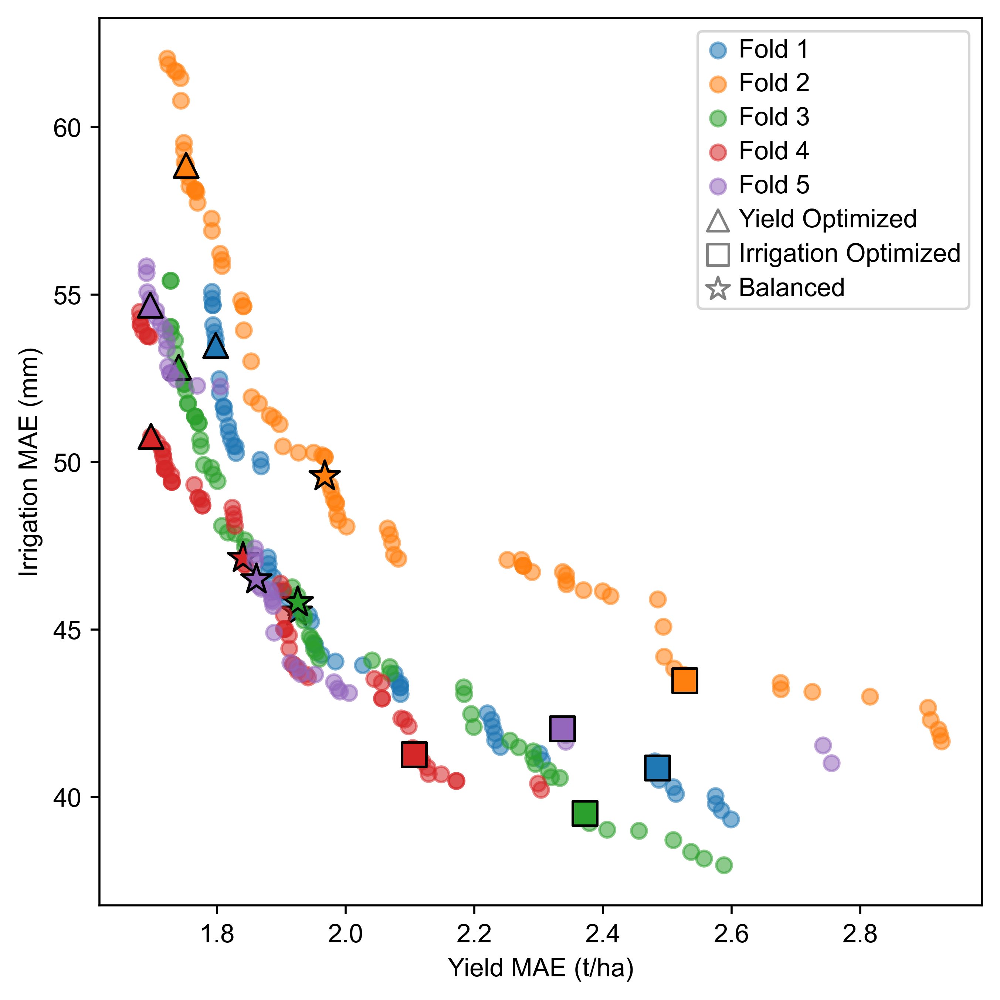

In [22]:
# plt.rcParams['font.size'] = 10

# Run the plot
plot_pareto_all(
    folder="1st_5_pareto",                                              
    xlabel="Yield MAE (t/ha)",                                            
    ylabel="Irrigation MAE (mm)",                                           
#     title="Yield vs Irrigation Pareto Fronts (5-Fold Cross Validation)",
    pct = 12
)

# make legend holo
# plot

# look at soil and CDL low percentage
# update the doc.


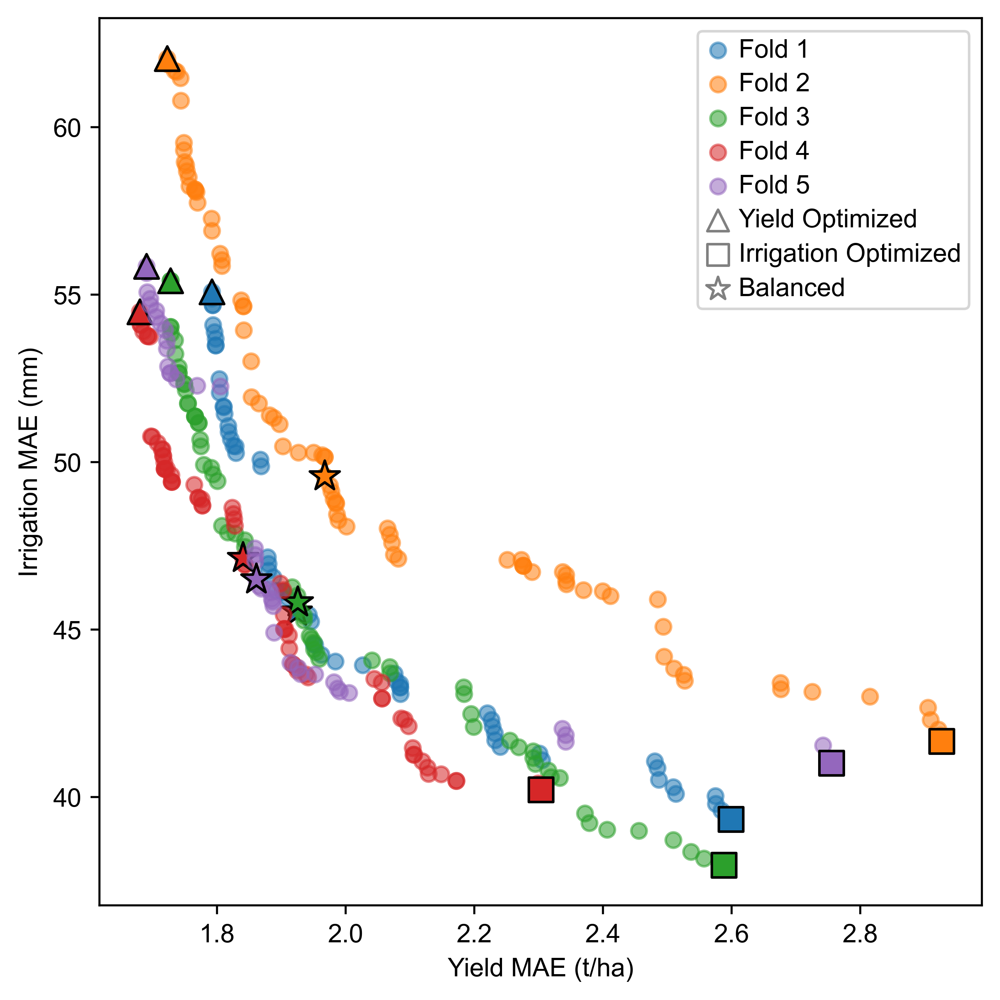

In [54]:
# plt.rcParams['font.size'] = 10

# Run the plot
plot_pareto_all(
    folder="1st_5_pareto",                                              
    xlabel="Yield MAE (t/ha)",                                            
    ylabel="Irrigation MAE (mm)",                                           
#     title="Yield vs Irrigation Pareto Fronts (5-Fold Cross Validation)",
    pct = 1
)

# make legend holo
# plot

# look at soil and CDL low percentage
# update the doc.


In [8]:

def get_special_points(df, tol=10):
    """
    Select Yield-optimized, Irrigation-optimized, and Balanced points.
    Uses percentile thresholds (e.g., pct=10 means best 10% zone).

    Returns:
        yield_opt, irr_opt, balanced
    """
    pct = tol
    y = df["MAE (Yield)"]
    i = df["MAE (Irrigation)"]

    # ---- Percentile thresholds ----
    y_thresh = np.percentile(y, pct)
    i_thresh = np.percentile(i, pct)

    # ---- Yield-Optimized (best irrigation inside best-yield band) ----
    df_y = df[y <= y_thresh]
    if df_y.empty:
        # fallback: global minimum yield
        yield_opt = df.loc[y.idxmin()]
    else:
        yield_opt = df_y.loc[df_y["MAE (Irrigation)"].idxmin()]

    # ---- Irrigation-Optimized (best yield inside best-irrigation band) ----
    df_i = df[i <= i_thresh]
    if df_i.empty:
        # fallback: global minimum irrigation
        irr_opt = df.loc[i.idxmin()]
    else:
        irr_opt = df_i.loc[df_i["MAE (Yield)"].idxmin()]

    # ---- Balanced (closest to median point in objective space) ----
    # Normalize Y and I to 0–1 range
    y_norm = (y - y.min()) / (y.max() - y.min())
    i_norm = (i - i.min()) / (i.max() - i.min())

    # Compute medians on normalized values
    median_y = np.median(y_norm)
    median_i = np.median(i_norm)

    # Distance in normalized space
    dist = np.sqrt((y_norm - median_y)**2 + (i_norm - median_i)**2)

    # Balanced solution = closest to the normalized medians
    balanced = df.loc[dist.idxmin()]


    return yield_opt, irr_opt, balanced


def load_fold_parameters_from_folder(folder, mode="yield", tol = 12):
    """
    Reads 5 parameter-result CSVs from folder.
    Extracts:
        - yield optimized OR
        - irrigation optimized OR
        - balanced
    Returns:
        A list of 5 parameter dictionaries, one per fold.
    """
    files = sorted(glob.glob(folder + "/*.csv"))
    params_list = []

    print(f"\nReading parameter CSVs from: {folder}")
    print(f"Optimization target: {mode}\n")

    for fold_id, file in enumerate(files, start=1):
        print(f"  → Fold {fold_id}: loading {file}")

        df = pd.read_csv(file)

        # Extract special points
        y_opt, i_opt, bal = get_special_points(df, tol)

        if mode == "yield":
            row = y_opt
        elif mode == "irrig":
            row = i_opt
        else:
            row = bal

        # Convert row → parameter dict
        params = {
            "smt_1": row["smt_1"],
            "smt_2": row["smt_2"],
            "smt_3": row["smt_3"],
            "smt_4": row["smt_4"],
            "CCx": row["CCx"],
            "WP": row["WP"],
            "Kcb": row["Kcb"],
            "HI0": row["HI0"],
            "a_HI": row["a_HI"],
            "Zmax": row["Zmax"],
        }

        params_list.append(params)

    return params_list

# It runs AquaCrop ONE time over ALL YEARS for a given parameter set

def run_aquacrop_for_fold(params, train_df, test_df, fold_id,
                          no_et=True,
                          climate_path="Data/Updated_all_fieldsclimate.csv"):
    """
    Runs AquaCrop simulation for all FIDs in the climate dataset,
    using parameter set for this fold.

    Returns:
        train_results  → merged simulation vs reported for train
        test_results   → merged simulation vs reported for test
    """

    print(f"\n==============================")
    print(f" Running Fold {fold_id} ")
    print(f" Using parameters: {params}")
    print(f"==============================\n")

    # -----------------------------------------------------------
    # Load climate data for all AquaCrop simulations
    # -----------------------------------------------------------
    df = pd.read_csv(climate_path)
    df["Date"] = pd.to_datetime(df["Date"].str[:8])
    df["Year"] = df["Date"].dt.year
    
    unique_fids = df["fid"].unique()

    all_ET_df = []
    all_yld_df = []

    # -----------------------------------------------------------
    # Run AquaCrop for every field
    # -----------------------------------------------------------
    for fid in unique_fids:
        model, field_df, field_yld, _ = run_aquacrop_model_for_fid(
            df, fid,
            sim_start="2006/01/01",
            sim_end="2023/12/30",
            smt=[params["smt_1"], params["smt_2"], params["smt_3"], params["smt_4"]],
            CCx=params["CCx"],
            WP=params["WP"],
            Kcb=params["Kcb"],
            HI0=params["HI0"],
            a_HI=params["a_HI"],
            Zmax=params["Zmax"]
        )

        all_ET_df.append(field_df)
        all_yld_df.append(field_yld)

    # -----------------------------------------------------------
    # Combine all fields
    # -----------------------------------------------------------
    all_ET_df = pd.concat(all_ET_df, ignore_index=True)
    all_yld_df = pd.concat(all_yld_df, ignore_index=True)

    all_ET_df["Year"] = all_ET_df["Date"].dt.year
    all_yld_df["Year"] = all_yld_df["Harvest Date (YYYY/MM/DD)"].dt.year

    # -----------------------------------------------------------
    # Merge with TRAIN reported data
    # -----------------------------------------------------------
    train_merge = pd.merge(
        all_yld_df,
        train_df,
        on=["FieldID", "Year"],
        how="inner"
    )

    train_merge.rename(columns={
        "Seasonal irrigation (mm)": "Simulated_Irrigation",
        "Yield (tonne/ha)": "Simulated_Yield"
    }, inplace=True)

    # -----------------------------------------------------------
    # Merge with TEST reported data
    # -----------------------------------------------------------
    test_merge = pd.merge(
        all_yld_df,
        test_df,
        on=["FieldID", "Year"],
        how="inner"
    )

    test_merge.rename(columns={
        "Seasonal irrigation (mm)": "Simulated_Irrigation",
        "Yield (tonne/ha)": "Simulated_Yield"
    }, inplace=True)

    return train_merge, test_merge






def run_5fold_aquacrop_from_params(params_list, reported_csv, label):
    """
    params_list: list of 5 parameter dicts (one per fold)
    reported_csv: full reported dataframe
    label: only for printing
    """

    print(f"\nRunning 5-fold AquaCrop for: {label}")
    


    reported = pd.read_csv(reported_csv)
    kf = KFold(n_splits=5, shuffle=True, random_state=153)

    train_results_all = []
    test_results_all = []

    fold_id = 0

    for (train_idx, test_idx), params in zip(kf.split(reported), params_list):
        fold_id += 1

        train_df = reported.iloc[train_idx].copy()
        test_df = reported.iloc[test_idx].copy()
        print(f"\n--- Fold {fold_id} ---")
        print(f"Train reported size: {len(train_df)}")
        print(f"Test reported size:  {len(test_df)}")
        
        train_sim, test_sim = run_aquacrop_for_fold(
            params=params,
            train_df=train_df,
            test_df=test_df,
            fold_id=fold_id
        )
        print(f"Train simulated/merged size: {len(train_sim)}")
        print(f"Test simulated/merged size:  {len(test_sim)}")
        train_sim["Dataset"] = "train"
        test_sim["Dataset"] = "test"

        train_results_all.append(train_sim)
        test_results_all.append(test_sim)

    train_final = pd.concat(train_results_all)
    test_final = pd.concat(test_results_all)

    return train_final, test_final




# MASTER PIPELINE – AUTOMATES ALL 5 FOLDS & PLOTTING

def full_pipeline(folder, reported_csv, mode="yield", tol=0.10):
    """
    Complete pipeline:
    1. Read 5 CSVs from folder
    2. Extract special-point parameters
    3. Run 5-fold AquaCrop
    4. Plot results
    """

    # Step 1: load parameters
    params_list = load_fold_parameters_from_folder(folder, mode=mode, tol=tol)

    # Step 2: run AquaCrop 5-fold
    train_df, test_df = run_5fold_aquacrop_from_params(
        params_list=params_list,
        reported_csv=reported_csv,
        label=mode
    )

    # Step 3: Plot
#     title = f"{mode.capitalize()}-Optimized AquaCrop Performance (5-Fold)"
#     plot_yield_results(train_df, test_df, title)

    return train_df, test_df




In [9]:
yield_train, yield_test = full_pipeline(
    folder="1st_5_pareto",
    reported_csv="full_data_excluding_bad_fields.csv",
    mode="yield",
    tol=12
)



Reading parameter CSVs from: 1st_5_pareto
Optimization target: yield

  → Fold 1: loading 1st_5_pareto/Pareto_Run1.csv
  → Fold 2: loading 1st_5_pareto/Pareto_Run2.csv
  → Fold 3: loading 1st_5_pareto/Pareto_Run3.csv
  → Fold 4: loading 1st_5_pareto/Pareto_Run4.csv
  → Fold 5: loading 1st_5_pareto/Pareto_Run5.csv

Running 5-fold AquaCrop for: yield

--- Fold 1 ---
Train reported size: 92
Test reported size:  24

 Running Fold 1 
 Using parameters: {'smt_1': 32.270801497278036, 'smt_2': 55.37055848525044, 'smt_3': 31.165075738865497, 'smt_4': 59.99115342850839, 'CCx': 0.9333526657032823, 'WP': 30.63435893975408, 'Kcb': 1.0700952458269275, 'HI0': 0.5173354347911169, 'a_HI': 9.8016206250272, 'Zmax': 1.7893683175684365}

Train simulated/merged size: 92
Test simulated/merged size:  24

--- Fold 2 ---
Train reported size: 93
Test reported size:  23

 Running Fold 2 
 Using parameters: {'smt_1': 42.3661366174199, 'smt_2': 30.44076637921177, 'smt_3': 35.96317702906983, 'smt_4': 59.92471884311

In [42]:
def plot_yield_comparison(
    df, 
    x_col: str = 'Reported_Yield', 
    y_col: str = 'Simulated_Yield', 
    df_type: str = "Test", 
    hue: str = None,
    style: str = None,
    metric: bool = True,
    x_axis: str = None,
    y_axis: str = None,
    xlim: tuple = (0, 19), 
    ylim: tuple = (0, 19),
    bound: tuple = None,
    text = None,
    color=None,
    ax=None,
    fontsize = 10,
    label_prefix: str = "",
    one_to_one_line: bool = True,
    show_xlabel: bool = True,   # NEW
    show_ylabel: bool = True    # NEW
) -> tuple:
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    from scipy.stats import pearsonr

    def pbias(observed, predicted):
        return 100 * np.sum(predicted - observed ) / np.sum(observed)

    def nmae(predicted, observed):
        return 100 * mean_absolute_error(observed, predicted) / np.mean(observed)

    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = None
        
    if color is None:
        color = "red"

    # Optional 1:1 line
    if one_to_one_line:
        ax.axline((0, 0), slope=1, label='1:1 line', color='gray', linestyle='--')

    # Scatter plot
    sns.scatterplot(data=df, x=x_col, y=y_col, hue=hue, ax=ax, color=color, style=style, s=50, edgecolor='k', label=f'{label_prefix} points')

    # Regression line
    sns.regplot(data=df, x=x_col, y=y_col, scatter=False, ci=None, ax=ax, color=color, label=f'{label_prefix} regression line')

    # Shaded bound region
    if bound:
        x_range = np.linspace(df[x_col].min(), df[x_col].max(), len(df))
        ax.fill_between(x_range, bound[0], bound[1], color='gray', alpha=0.3)

    # Axis limits
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    # OPTIONAL LABELS
    if show_xlabel:
        ax.set_xlabel(x_axis or x_col, fontsize=fontsize)
    else:
        ax.set_xlabel("")

    if show_ylabel:
        ax.set_ylabel(y_axis or y_col, fontsize=fontsize)
    else:
        ax.set_ylabel("")

    # Metrics
    observed = df[x_col].values
    predicted = df[y_col].values

    corr, _ = pearsonr(observed, predicted)
    mae = mean_absolute_error(observed, predicted)
    rmse = np.sqrt(mean_squared_error(observed, predicted))
    r2 = r2_score(observed, predicted)
    pbias_value = pbias(observed, predicted)
    nmae_value = nmae(predicted, observed)

    if metric:
        text_x = 0.02 if label_prefix == "Train" else 0.02
        text_y = 0.79 if label_prefix == "Train" else 0.50

        ax.annotate(
            f"{label_prefix} Set:\n"
            f"RMSE: {rmse:.1f}\n"
            f"PBIAS: {pbias_value:.1f}%\n"
            f"NMAE: {nmae_value:.1f}%\n"
            f"$R^2$: {corr**2:.2f}",
            xy=(text_x, text_y),
            xycoords='axes fraction',
            fontsize=7
        )

#     ax.legend(loc='lower right', fontsize=6) #uncomment it if u want legend
    ax.legend().remove() # comment it if u want legend

    if text is not None:
        ax.text(0.45, .95, text, transform=ax.transAxes, ha='center', va='bottom', fontsize=7)
        
    if x_col == "Reported_Yield":
        
        ticks = [0, 5, 10, 15]
        ax.set_xticks(ticks)
        ax.set_yticks(ticks)

    elif x_col == "Reported_Irrigation":
        ticks = [200, 400, 600]
        ax.set_xticks(ticks)
        ax.set_yticks(ticks)

    if fig:
        ax.set_title(f"{df_type}")
        return fig, ax
    return ax


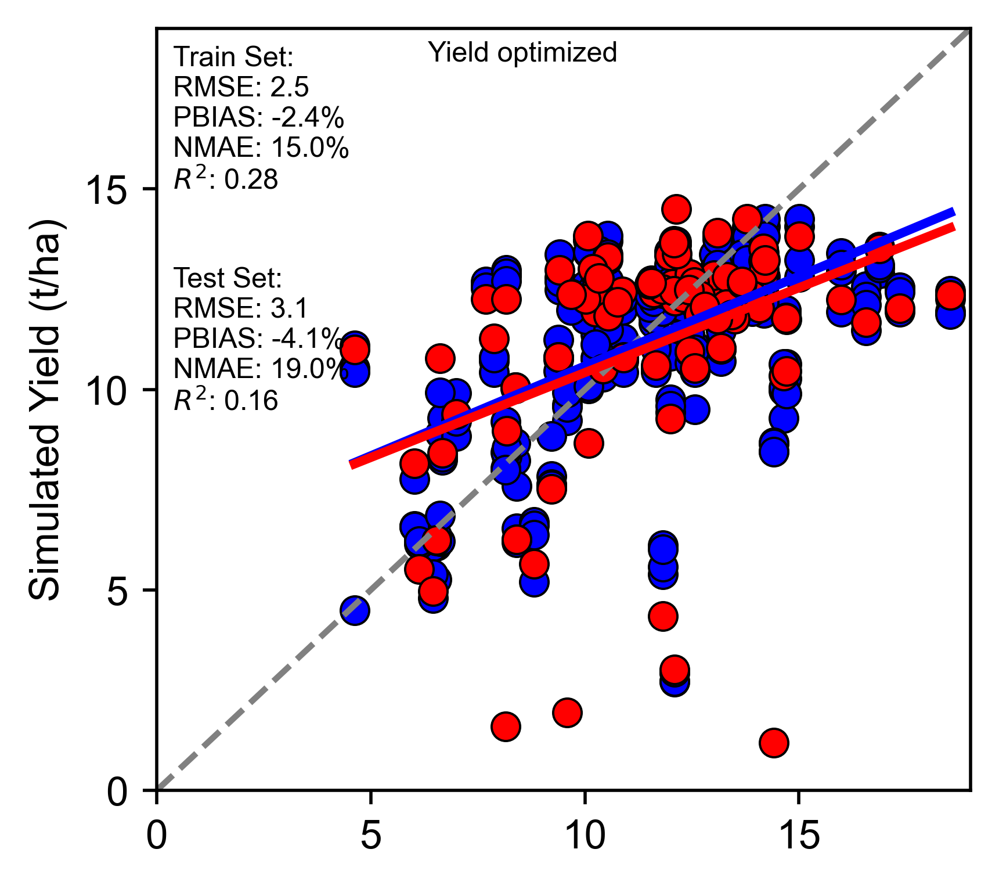

In [43]:
fig, ax = plt.subplots()
# fig, ax = plt.subplots(figsize=(8, 6))

# Plot: Train set (on same ax)
plot_yield_comparison(
    df=yield_train.dropna(subset=["Reported_Yield", "Simulated_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
    text="",
    x_axis="Reported Yield (t/ha)",  # Repeated for consistency
    y_axis="Simulated Yield (t/ha)",
    color ='blue',
    ax=ax,
    label_prefix="Train",
    show_xlabel = None

)

# Plot: Test set
plot_yield_comparison(
    df=yield_test.dropna(subset=["Reported_Yield", "Simulated_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
    text="Yield optimized",
    x_axis="Reported Yield (t/ha)",
    y_axis="Simulated Yield (t/ha)",
    ax=ax,
    one_to_one_line = False,
    label_prefix="Test",
    show_xlabel = None,
#     xlim = (0,18),
#     ylim = (0,18)
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()
# ---------- SAVE THE FIGURE ----------
output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/yld_opt_yld.png",
            dpi=500,
            bbox_inches="tight")

plt.show()


filenames=["yld_opt_yld.png", "yld_opt_irrig.png", "irrig_opt_yld.png", "irrig_opt_irrig.png",
                "bal_opt_yld.png", "bal_opt_irrig.png"],

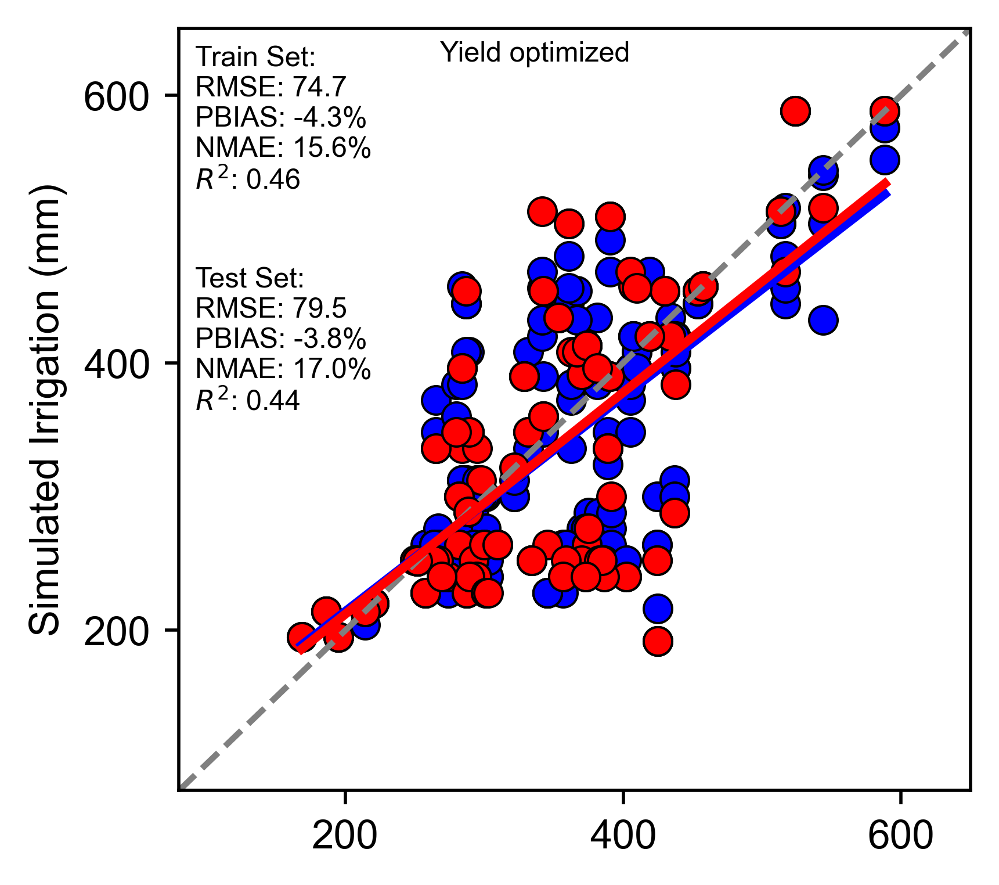

In [44]:


fig, ax = plt.subplots()



# Plot: Train set (on same ax)
plot_yield_comparison(
    df=yield_train.dropna(subset=["Reported_Irrigation", "Simulated_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
    text="",
    x_axis="Reported Irrigation (mm)",  # Repeated for consistency
    y_axis="Simulated Irrigation (mm)",
    color ='blue',
    ax=ax,
    xlim = (80, 650), 
    ylim= (80, 650),
    label_prefix="Train",
    show_xlabel = False   # NEW

)

# Plot: Test set
plot_yield_comparison(
    df=yield_test.dropna(subset=["Reported_Irrigation", "Simulated_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
    text="Yield optimized",
    x_axis="Reported Irrigation (mm)",
    y_axis="Simulated Irrigation (mm)",
    ax=ax,
    xlim = (80, 650), 
    ylim= (80, 650),
    one_to_one_line = False,
    label_prefix="Test",
    show_xlabel = False
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()
# ---------- SAVE THE FIGURE ----------
output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/yld_opt_irrig.png",
            dpi=500,
            bbox_inches="tight")

plt.show()



## Irrig

In [23]:
irrig_train, irrig_test = full_pipeline(
    folder="1st_5_pareto",
    reported_csv="full_data_excluding_bad_fields.csv",
    mode="irrig",
    tol=12
)



Reading parameter CSVs from: 1st_5_pareto
Optimization target: irrig

  → Fold 1: loading 1st_5_pareto/Pareto_Run1.csv
  → Fold 2: loading 1st_5_pareto/Pareto_Run2.csv
  → Fold 3: loading 1st_5_pareto/Pareto_Run3.csv
  → Fold 4: loading 1st_5_pareto/Pareto_Run4.csv
  → Fold 5: loading 1st_5_pareto/Pareto_Run5.csv

Running 5-fold AquaCrop for: irrig

--- Fold 1 ---
Train reported size: 92
Test reported size:  24

 Running Fold 1 
 Using parameters: {'smt_1': 54.49452787160702, 'smt_2': 54.23852598972047, 'smt_3': 53.79612016010603, 'smt_4': 59.78235758338874, 'CCx': 0.9790255269828092, 'WP': 30.011577930011377, 'Kcb': 1.0668874542064253, 'HI0': 0.5161715509300256, 'a_HI': 0.5000203652272963, 'Zmax': 1.216517730681318}

Train simulated/merged size: 92
Test simulated/merged size:  24

--- Fold 2 ---
Train reported size: 93
Test reported size:  23

 Running Fold 2 
 Using parameters: {'smt_1': 53.38954493219093, 'smt_2': 33.02119790976675, 'smt_3': 53.88906133447363, 'smt_4': 58.609735487

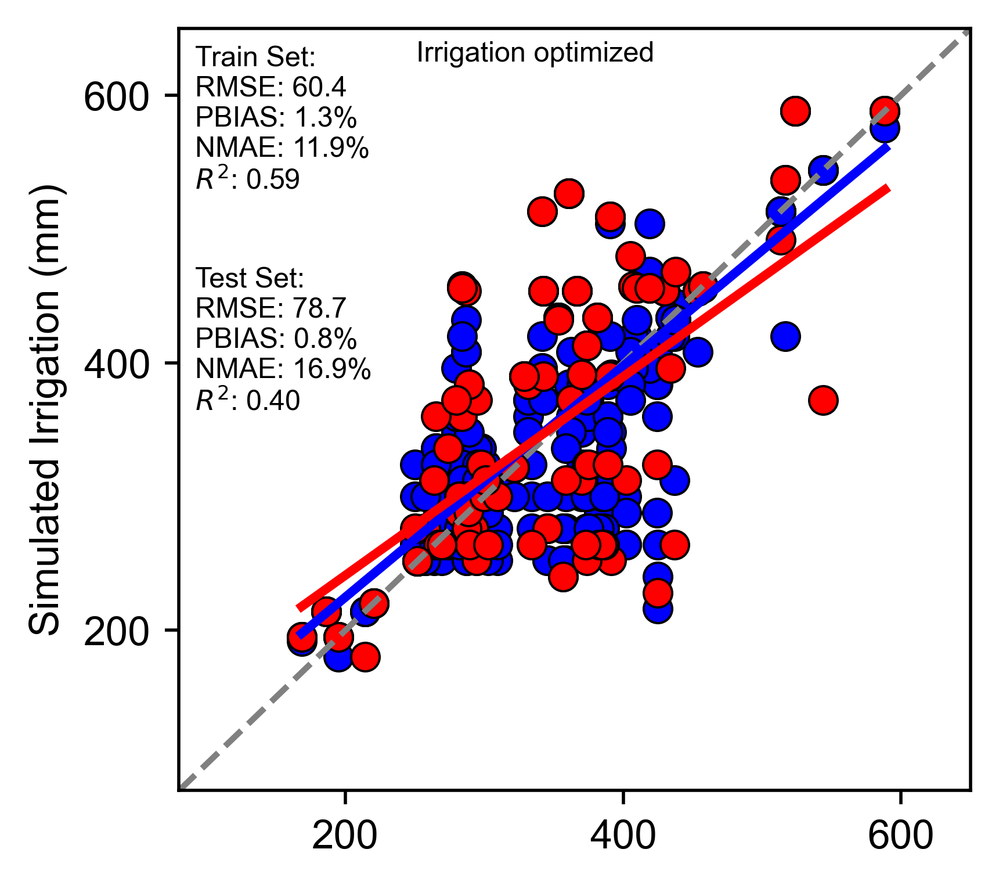

In [45]:
fig, ax = plt.subplots()



# Plot: Train set (on same ax)
plot_yield_comparison(
    df=irrig_train.dropna(subset=["Reported_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
#     text="Baseline",
    x_axis="Reported Irrigation (mm)",  # Repeated for consistency
    y_axis="Simulated Irrigation (mm)",
    color ='blue',
    ax=ax,
    xlim= (140, 756), 
    ylim= (140, 756),
    label_prefix="Train",
    show_xlabel = False
)

# # Plot: Test set
plot_yield_comparison(
    df=irrig_test.dropna(subset=["Reported_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
    text="Irrigation optimized",
    x_axis="Reported Irrigation (mm)",
    y_axis="Simulated Irrigation (mm)",
    ax=ax,
    xlim = (80, 650), 
    ylim= (80, 650),
    one_to_one_line = False,
    label_prefix="Test",
    show_xlabel = False
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()
# ---------- SAVE THE FIGURE ----------
output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/irrig_opt_irrig.png",
            dpi=500,
            bbox_inches="tight")

plt.show()


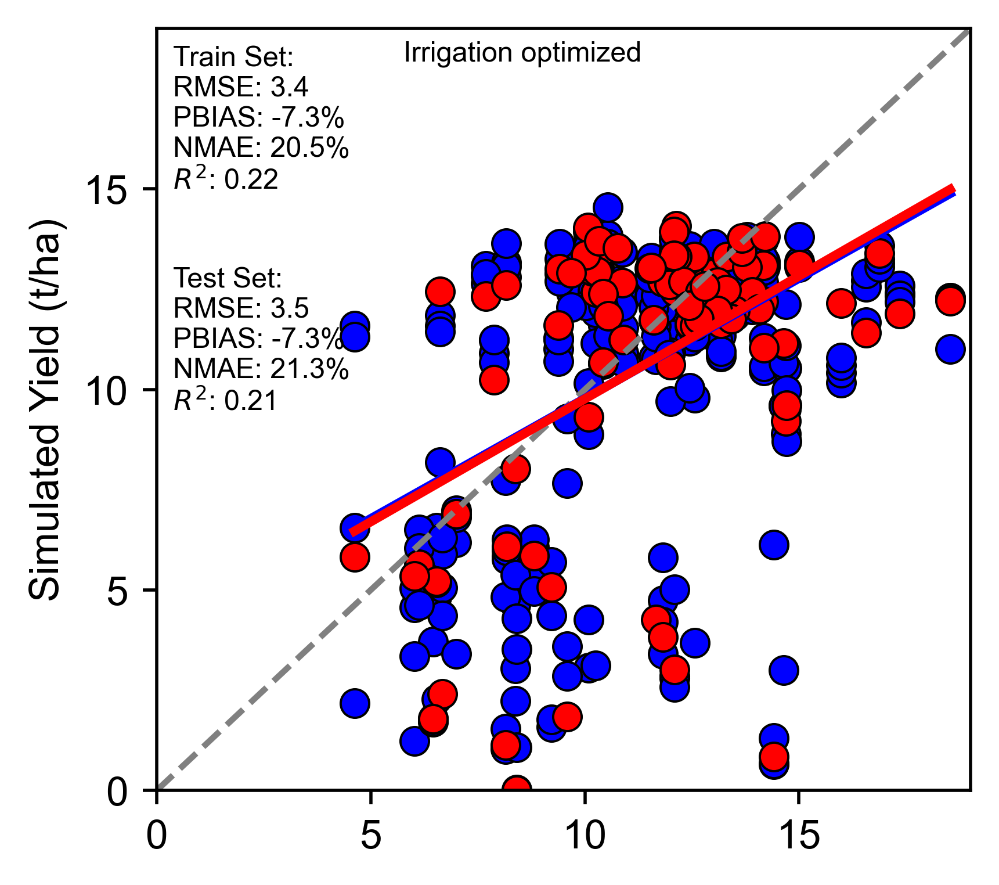

In [46]:
fig, ax = plt.subplots()



# Plot: Train set (on same ax)
plot_yield_comparison(
    df=irrig_train.dropna(subset=["Reported_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
#     text="Baseline",
    x_axis="Reported Yield (t/ha)",  # Repeated for consistency
    y_axis="Simulated Irrigation (t/ha)",
    color ='blue',
    ax=ax,
    label_prefix="Train",
    show_xlabel = False
)

# # Plot: Test set
plot_yield_comparison(
    df=irrig_test.dropna(subset=["Reported_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
    text="Irrigation optimized",
    x_axis="Reported Yield (t/ha)",
    y_axis="Simulated Yield (t/ha)",
    ax=ax,
    one_to_one_line = False,
    label_prefix="Test",
    show_xlabel = False
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()
output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/irrig_opt_yld.png",
            dpi=500,
            bbox_inches="tight")

plt.show()


## Balanced

In [27]:
balc_train, balc_test = full_pipeline(
    folder="1st_5_pareto",
    reported_csv="full_data_excluding_bad_fields.csv",
    mode="bal",
    tol=12
)



Reading parameter CSVs from: 1st_5_pareto
Optimization target: bal

  → Fold 1: loading 1st_5_pareto/Pareto_Run1.csv
  → Fold 2: loading 1st_5_pareto/Pareto_Run2.csv
  → Fold 3: loading 1st_5_pareto/Pareto_Run3.csv
  → Fold 4: loading 1st_5_pareto/Pareto_Run4.csv
  → Fold 5: loading 1st_5_pareto/Pareto_Run5.csv

Running 5-fold AquaCrop for: bal

--- Fold 1 ---
Train reported size: 92
Test reported size:  24

 Running Fold 1 
 Using parameters: {'smt_1': 31.72254328494226, 'smt_2': 49.82788447857104, 'smt_3': 52.258927070351405, 'smt_4': 59.50232095896679, 'CCx': 0.9411006536008352, 'WP': 30.631315088174105, 'Kcb': 1.051059111982713, 'HI0': 0.5330063979677326, 'a_HI': 0.5533159271133904, 'Zmax': 1.3396270422236616}

Train simulated/merged size: 92
Test simulated/merged size:  24

--- Fold 2 ---
Train reported size: 93
Test reported size:  23

 Running Fold 2 
 Using parameters: {'smt_1': 49.51331376233994, 'smt_2': 30.02572164460416, 'smt_3': 42.44947894615963, 'smt_4': 58.595637780120

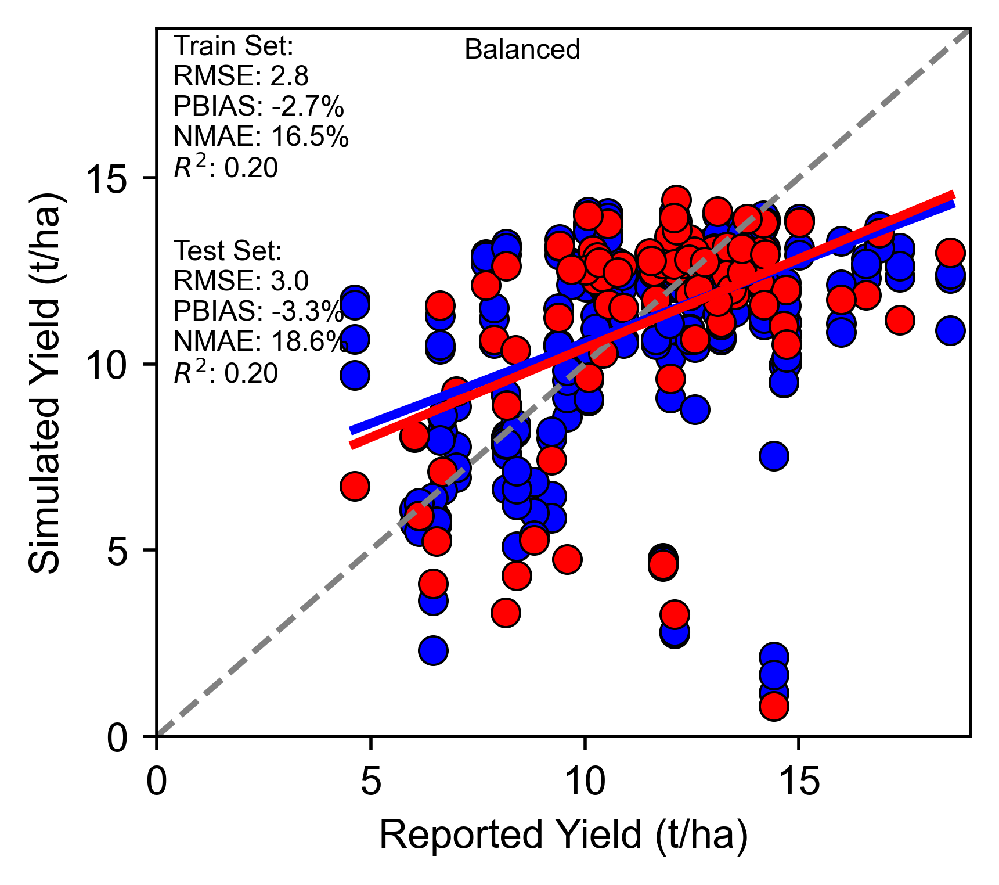

In [47]:
fig, ax = plt.subplots()



# Plot: Train set (on same ax)
plot_yield_comparison(
    df=balc_train.dropna(subset=["Reported_Yield", "Simulated_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
    text="",
    x_axis="Reported Yield (t/ha)",  # Repeated for consistency
    y_axis="Simulated Yield (t/ha)",
    color ='blue',
    ax=ax,
    label_prefix="Train"

)

# Plot: Test set
plot_yield_comparison(
    df=balc_test.dropna(subset=["Reported_Yield", "Simulated_Yield"]),
    x_col='Reported_Yield',
    y_col='Simulated_Yield',
    text="Balanced",
    x_axis="Reported Yield (t/ha)",
    y_axis="Simulated Yield (t/ha)",
    ax=ax,
    one_to_one_line = False,
    label_prefix="Test"
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()
output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/bal_opt_yld.png",
            dpi=500,
            bbox_inches="tight")

plt.show()


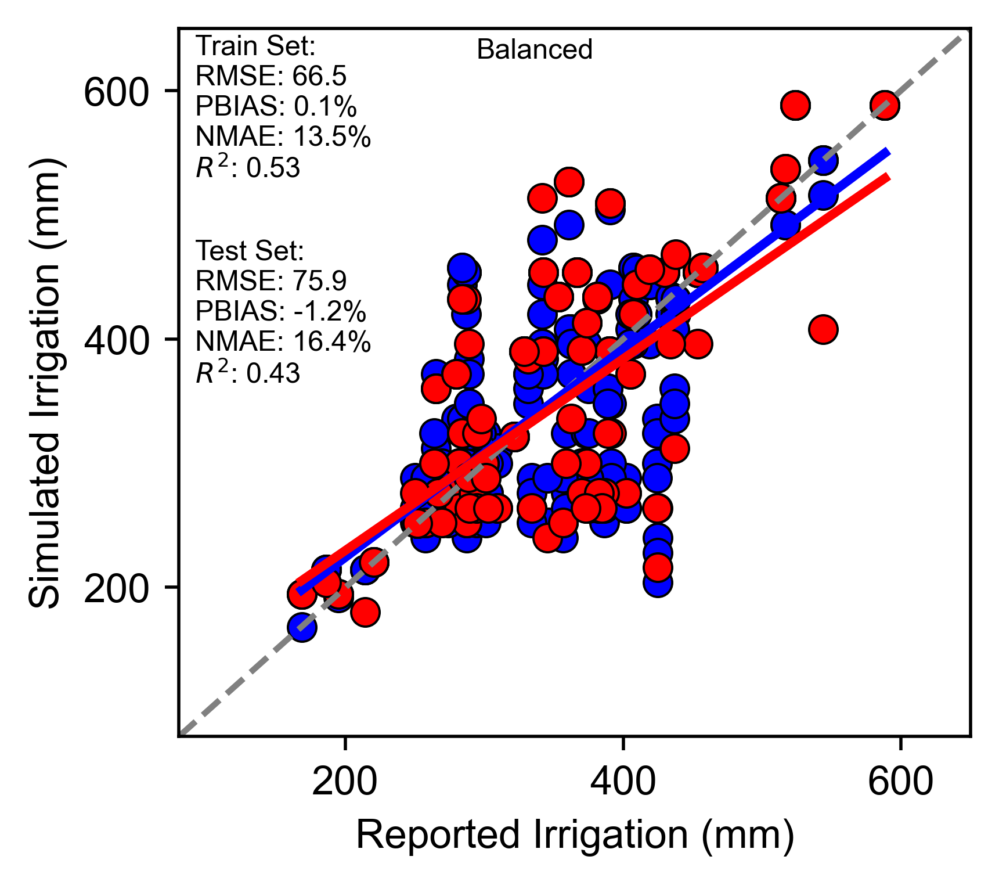

In [48]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()



# Plot: Train set (on same ax)
plot_yield_comparison(
    df=balc_train.dropna(subset=["Reported_Irrigation", "Simulated_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
    text="",
    x_axis="Reported Irrigation (mm)",  # Repeated for consistency
    y_axis="Simulated Irrigation (mm)",
    color ='blue',
    xlim = (80, 650), 
    ylim= (80, 650),
    ax=ax,
    label_prefix="Train"

)

# Plot: Test set
plot_yield_comparison(
    df=balc_test.dropna(subset=["Reported_Irrigation", "Simulated_Irrigation"]),
    x_col='Reported_Irrigation',
    y_col='Simulated_Irrigation',
    text="Balanced",
    x_axis="Reported Irrigation (mm)",
    y_axis="Simulated Irrigation (mm)",
    ax=ax,
    xlim = (80, 650), 
    ylim= (80, 650),
    one_to_one_line = False,
    label_prefix="Test"
)

# plt.title("Simulated vs Reported Yield: Train & Test Sets")
plt.tight_layout()

output_folder = "Aqua_6figs"
os.makedirs(output_folder, exist_ok=True)
fig.savefig(f"{output_folder}/bal_opt_irrig.png",
            dpi=500,
            bbox_inches="tight")

plt.show()


In [30]:
import pandas as pd
from sklearn.model_selection import KFold

# -------------------------------
# Load data
# -------------------------------
df = pd.read_csv("full_data_excluding_bad_fields.csv")

# Standardize column names (adjust if needed)
yield_col = "Reported_Yield"
irr_col   = "Reported_Irrigation"

print("Loaded dataframe:", df.shape)
print(df[[yield_col, irr_col]].isna().sum())
print("\n")

# -------------------------------
# 5-fold CV setup
# -------------------------------
kf = KFold(n_splits=5, shuffle=True, random_state=153)

fold_summary = []  # store for a table

# -------------------------------
# Evaluate missing values in each fold
# -------------------------------
for fold_id, (train_idx, test_idx) in enumerate(kf.split(df), start=1):

    train_df = df.iloc[train_idx]
    test_df  = df.iloc[test_idx]

    # Count NaN
    train_y_nan = train_df[yield_col].isna().sum()
    train_i_nan = train_df[irr_col].isna().sum()

    test_y_nan  = test_df[yield_col].isna().sum()
    test_i_nan  = test_df[irr_col].isna().sum()

    # Store results
    fold_summary.append({
        "Fold": fold_id,
        "Train Size": len(train_df),
        "Test Size": len(test_df),
        "Train Yield NaN": train_y_nan,
        "Train Irr NaN": train_i_nan,
        "Test Yield NaN": test_y_nan,
        "Test Irr NaN": test_i_nan
    })

    # Optional: print row IDs with NaN
    print(f"\n============== Fold {fold_id} ==============")
    print("Train NaN locations:")
#     print(train_df[train_df[yield_col].isna() | train_df[irr_col].isna()][["FieldID", "Year", yield_col, irr_col]])

    print("\nTest NaN locations:")
#     print(test_df[test_df[yield_col].isna() | test_df[irr_col].isna()][["FieldID", "Year", yield_col, irr_col]])

# -------------------------------
# Final Summary Table
# -------------------------------
summary_df = pd.DataFrame(fold_summary)
print("\n\n============= NaN Summary (per fold) =============")
print(summary_df)


Loaded dataframe: (116, 7)
Reported_Yield         27
Reported_Irrigation    38
dtype: int64



============== Fold 1 ==============
Train NaN locations:

Test NaN locations:

============== Fold 2 ==============
Train NaN locations:

Test NaN locations:

============== Fold 3 ==============
Train NaN locations:

Test NaN locations:

============== Fold 4 ==============
Train NaN locations:

Test NaN locations:

============== Fold 5 ==============
Train NaN locations:

Test NaN locations:


============= NaN Summary (per fold) =============
   Fold  Train Size  Test Size  Train Yield NaN  Train Irr NaN  \
0     1          92         24               20             32   
1     2          93         23               24             26   
2     3          93         23               20             32   
3     4          93         23               22             31   
4     5          93         23               22             31   

   Test Yield NaN  Test Irr NaN  
0               7     

In [44]:
78*20/100

15.6

In [46]:
24-5

19

In [55]:
df.dropna(subset=["Reported_Yield"])

,Unnamed: 0.1,Year,FieldID,cropType,Reported_Irrigation,Reported_Yield,Unnamed: 0
0,0,2016,NB1,Corn,300.984585,12.428670,NaN
1,1,2017,NB1,Corn,297.575357,10.184502,NaN
2,2,2018,NB1,Corn,369.860074,13.101181,NaN
3,4,2020,NB1,Corn,342.563728,8.171677,NaN
4,5,2021,NB1,Corn,286.767030,10.247718,NaN
...,...,...,...,...,...,...,...
111,136,2010,NW5,Corn,NaN,10.427278,NaN
112,137,2011,NW5,Corn,NaN,7.873083,NaN
113,138,2012,NW5,Corn,NaN,8.400331,NaN
114,139,2013,NW5,Corn,NaN,12.098467,NaN


## spatio-temporal metric data


In [45]:
def calculate_yearly_metrics(
    df,
    group_by_field=False,
    calculate_yield=True,
    calculate_irrigation=True,
    model=None,
    estimated="Simulated"
):
    """
    Calculate RMSE, PBIAS, and NMAE for yield and/or irrigation,
    grouped by Year or FieldID, and optionally tagged with a model name.

    Parameters:
    - df: DataFrame with required columns like:
        ['Year', 'FieldID', 'Reported_Yield', 'Simulated_Yield', ...]
    - group_by_field: Group by 'FieldID' instead of 'Year'
    - calculate_yield: Whether to calculate metrics for yield
    - calculate_irrigation: Whether to calculate metrics for irrigation
    - model: Optional string tag to label the model
    - estimated: Column prefix for simulated or predicted values (default: 'Simulated')

    Returns:
    - A tidy DataFrame with columns like:
        ['Year' or 'FieldID', 'Metric', 'Yield', 'Irrigation', 'Model' (if provided)]
    """

    group_cols = ['FieldID'] if group_by_field else ['Year']
    grouped = df.groupby(group_cols)
    results = []

    # Column names
    sim_yield_col = f"{estimated}_Yield"
    sim_irr_col = f"{estimated}_Irrigation"

    for keys, group in grouped:
        # Fix single-element tuple key from groupby
        if isinstance(keys, tuple) and len(keys) == 1:
            keys = keys[0]

        base = {"FieldID": keys} if group_by_field else {"Year": keys}
        if model:
            base["Model"] = model
        record = {}

        # --- Yield metrics ---
        if calculate_yield:
            yield_data = group[['Reported_Yield', sim_yield_col]].dropna()
            if not yield_data.empty:
                obs_y = yield_data['Reported_Yield'].values
                sim_y = yield_data[sim_yield_col].values
#                 print(len(obs_y))
                rmse_y = np.sqrt(mean_squared_error(obs_y, sim_y))
                pbias_y = 100 * np.sum(sim_y - obs_y) / np.sum(obs_y)
                nmae_y = 100 * mean_absolute_error(obs_y, sim_y) / np.mean(obs_y)
            else:
                rmse_y = pbias_y = nmae_y = np.nan

            record["RMSE"] = {"Yield": rmse_y}
            record["PBIAS"] = {"Yield": pbias_y}
            record["NMAE"] = {"Yield": nmae_y}

        # --- Irrigation metrics ---
        if calculate_irrigation:
            irr_data = group[['Reported_Irrigation', sim_irr_col]].dropna()
            if not irr_data.empty:
                obs_i = irr_data['Reported_Irrigation'].values
                sim_i = irr_data[sim_irr_col].values

                rmse_i = np.sqrt(mean_squared_error(obs_i, sim_i))
                pbias_i = 100 * np.sum( sim_i - obs_i) / np.sum(obs_i)
                nmae_i = 100 * mean_absolute_error(obs_i, sim_i) / np.mean(obs_i)
            else:
                rmse_i = pbias_i = nmae_i = np.nan

            if "RMSE" in record: record["RMSE"]["Irrigation"] = rmse_i
            else: record["RMSE"] = {"Irrigation": rmse_i}

            if "PBIAS" in record: record["PBIAS"]["Irrigation"] = pbias_i
            else: record["PBIAS"] = {"Irrigation": pbias_i}

            if "NMAE" in record: record["NMAE"]["Irrigation"] = nmae_i
            else: record["NMAE"] = {"Irrigation": nmae_i}

        # --- Format result ---
        for metric, values in record.items():
            row = base.copy()
            row["Metric"] = metric
            if calculate_yield:
                row["Yield"] = values.get("Yield", np.nan)
            if calculate_irrigation:
                row["Irrigation"] = values.get("Irrigation", np.nan)
            results.append(row)

    return pd.DataFrame(results)


In [65]:

yield_test

,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Simulated_Yield,Simulated_Irrigation,FieldID,Year,Unnamed: 0.1,cropType,Reported_Irrigation,Reported_Yield,Unnamed: 0,Dataset
0,14,MaizeGDD,2020-09-27,5382,12.175689,444.000000,WC1,2020,57,Corn,360.680000,NaN,NaN,train
1,13,MaizeGDD,2019-09-25,5014,12.661888,288.544000,WC3,2019,81,Corn,288.544000,NaN,NaN,train
2,14,MaizeGDD,2020-09-27,5382,12.088880,413.004000,WC4,2020,84,Corn,373.634000,NaN,NaN,train
3,14,MaizeGDD,2020-09-27,5382,12.083860,391.160000,WC5,2020,87,Corn,370.078000,NaN,NaN,train
4,5,MaizeGDD,2011-09-21,2088,11.453270,372.000000,NW6,2011,103,Corn,NaN,13.175157,NaN,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,11,MaizeGDD,2017-09-22,4281,11.359838,384.000000,SW1,2017,50,Corn,405.270174,NaN,NaN,train
89,12,MaizeGDD,2018-09-12,4636,11.775097,288.000000,SW1,2018,51,Corn,436.754370,NaN,NaN,train
90,13,MaizeGDD,2019-09-20,5009,12.333625,396.000000,SW1,2019,52,Corn,409.618317,NaN,NaN,train
91,14,MaizeGDD,2020-09-24,5379,10.157386,588.408179,SW1,2020,53,Corn,588.408179,NaN,NaN,train


In [56]:
#  we should do it only on test set
# just like we did for holdout results
aq_yr_yld = calculate_yearly_metrics(
    df=balc_test,
    group_by_field=False,
    calculate_yield=True,
    calculate_irrigation=False,
    model="AquaCrop-OSPy Balanced",
    estimated ="Simulated"
)

aq_yr_yld

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,Year,Model,Metric,Yield
0,2008,AquaCrop-OSPy Balanced,RMSE,0.938362
1,2008,AquaCrop-OSPy Balanced,PBIAS,-2.163032
2,2008,AquaCrop-OSPy Balanced,NMAE,6.420486
3,2009,AquaCrop-OSPy Balanced,RMSE,2.925400
4,2009,AquaCrop-OSPy Balanced,PBIAS,25.088996
5,2009,AquaCrop-OSPy Balanced,NMAE,25.088996
6,2010,AquaCrop-OSPy Balanced,RMSE,1.651957
7,2010,AquaCrop-OSPy Balanced,PBIAS,13.354184
8,2010,AquaCrop-OSPy Balanced,NMAE,13.354184
9,2011,AquaCrop-OSPy Balanced,RMSE,1.775800


In [57]:
#  we should do it only on test set
# just like we did for holdout results
aq_fid_yld = calculate_yearly_metrics(
    df=balc_test,
    group_by_field=True,
    calculate_yield=True,
    calculate_irrigation=False,
    model="AquaCrop-OSPy Balanced",
    estimated ="Simulated"
)

aq_fid_yld

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,FieldID,Model,Metric,Yield
0,NB1,AquaCrop-OSPy Balanced,RMSE,2.246841
1,NB1,AquaCrop-OSPy Balanced,PBIAS,-2.859084
2,NB1,AquaCrop-OSPy Balanced,NMAE,16.368174
3,NC1,AquaCrop-OSPy Balanced,RMSE,5.302763
4,NC1,AquaCrop-OSPy Balanced,PBIAS,-31.284085
...,...,...,...,...
76,WC8,AquaCrop-OSPy Balanced,PBIAS,NaN
77,WC8,AquaCrop-OSPy Balanced,NMAE,NaN
78,WC9,AquaCrop-OSPy Balanced,RMSE,NaN
79,WC9,AquaCrop-OSPy Balanced,PBIAS,NaN


In [58]:
aq_fid_yld.dropna(axis  = 0, inplace = True)
aq_fid_yld

,FieldID,Model,Metric,Yield
0,NB1,AquaCrop-OSPy Balanced,RMSE,2.246841
1,NB1,AquaCrop-OSPy Balanced,PBIAS,-2.859084
2,NB1,AquaCrop-OSPy Balanced,NMAE,16.368174
3,NC1,AquaCrop-OSPy Balanced,RMSE,5.302763
4,NC1,AquaCrop-OSPy Balanced,PBIAS,-31.284085
5,NC1,AquaCrop-OSPy Balanced,NMAE,31.284085
6,NC2,AquaCrop-OSPy Balanced,RMSE,4.332445
7,NC2,AquaCrop-OSPy Balanced,PBIAS,-24.904238
8,NC2,AquaCrop-OSPy Balanced,NMAE,24.904238
9,NW1,AquaCrop-OSPy Balanced,RMSE,2.846019


In [60]:
# aq_yr_yld.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/yr_df_yield_balncd.csv')

# aq_fid_yld.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/fiddf_yield_balncd.csv')


# Irrig

In [62]:
aq_yr_irrig = calculate_yearly_metrics(
    df=balc_test,
    group_by_field=False,
    calculate_yield=False,
    calculate_irrigation=True,
    model="AquaCrop-OSPy Balanced",
    estimated ="Simulated"
)

aq_yr_irrig

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,Year,Model,Metric,Irrigation
0,2008,AquaCrop-OSPy Balanced,RMSE,NaN
1,2008,AquaCrop-OSPy Balanced,PBIAS,NaN
2,2008,AquaCrop-OSPy Balanced,NMAE,NaN
3,2009,AquaCrop-OSPy Balanced,RMSE,NaN
4,2009,AquaCrop-OSPy Balanced,PBIAS,NaN
5,2009,AquaCrop-OSPy Balanced,NMAE,NaN
6,2010,AquaCrop-OSPy Balanced,RMSE,NaN
7,2010,AquaCrop-OSPy Balanced,PBIAS,NaN
8,2010,AquaCrop-OSPy Balanced,NMAE,NaN
9,2011,AquaCrop-OSPy Balanced,RMSE,NaN


In [63]:
aq_yr_irrig.dropna(inplace = True)
aq_yr_irrig

,Year,Model,Metric,Irrigation
21,2015,AquaCrop-OSPy Balanced,RMSE,76.078657
22,2015,AquaCrop-OSPy Balanced,PBIAS,19.664299
23,2015,AquaCrop-OSPy Balanced,NMAE,22.520990
24,2016,AquaCrop-OSPy Balanced,RMSE,81.546408
25,2016,AquaCrop-OSPy Balanced,PBIAS,-17.172271
26,2016,AquaCrop-OSPy Balanced,NMAE,18.632461
27,2017,AquaCrop-OSPy Balanced,RMSE,46.661049
28,2017,AquaCrop-OSPy Balanced,PBIAS,-6.837746
29,2017,AquaCrop-OSPy Balanced,NMAE,11.152949
30,2018,AquaCrop-OSPy Balanced,RMSE,107.898841


In [64]:
aq_fid_irrig = calculate_yearly_metrics(
    df=balc_test,
    group_by_field=True,
    calculate_yield=False,
    calculate_irrigation=True,
    model="AquaCrop-OSPy Balanced",
    estimated ="Simulated"
)

aq_fid_irrig

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,FieldID,Model,Metric,Irrigation
0,NB1,AquaCrop-OSPy Balanced,RMSE,79.815265
1,NB1,AquaCrop-OSPy Balanced,PBIAS,6.675445
2,NB1,AquaCrop-OSPy Balanced,NMAE,17.740382
3,NC1,AquaCrop-OSPy Balanced,RMSE,27.219405
4,NC1,AquaCrop-OSPy Balanced,PBIAS,-4.072905
...,...,...,...,...
76,WC8,AquaCrop-OSPy Balanced,PBIAS,-30.614495
77,WC8,AquaCrop-OSPy Balanced,NMAE,30.614495
78,WC9,AquaCrop-OSPy Balanced,RMSE,64.874000
79,WC9,AquaCrop-OSPy Balanced,PBIAS,-16.682524


In [65]:
aq_fid_irrig.isna().sum()

FieldID       0
Model         0
Metric        0
Irrigation    0
dtype: int64

In [66]:
# aq_yr_irrig.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/yr_df_irig_balncd.csv')

# aq_fid_irrig.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/fiddf_irig_balncd.csv')


In [47]:
ydf

,Unnamed: 0_x,Year,FieldID,cropType,Reported_Irrigation,Reported_Yield,Unnamed: 0_y,_merge
0,0,2016,NB1,Corn,300.984585,12.428670,NaN,left_only
1,1,2017,NB1,Corn,297.575357,10.184502,NaN,left_only
2,2,2018,NB1,Corn,369.860074,13.101181,NaN,left_only
3,3,2019,NB1,Corn,255.200892,10.076228,3.0,both
4,4,2020,NB1,Corn,342.563728,8.171677,NaN,left_only
...,...,...,...,...,...,...,...,...
136,138,2010,NW5,Corn,NaN,10.427278,NaN,left_only
137,139,2011,NW5,Corn,NaN,7.873083,NaN,left_only
138,140,2012,NW5,Corn,NaN,8.400331,NaN,left_only
139,141,2013,NW5,Corn,NaN,12.098467,NaN,left_only


In [67]:
# benchmark

ydf= pd.read_csv ("/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/All_reported_data.csv")

bad_fields = pd.read_csv("/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/bad_fields.csv")
ydf = ydf.merge(bad_fields, on=["Year", "FieldID"], how="left", indicator=True)
ydff = ydf[ydf["_merge"] == "left_only"].drop(columns=["_merge"])

yield_df = ydff[["Reported_Yield", "Year", "FieldID"]].dropna()
yield_df["Predicted_Yield"] = yield_df["Reported_Yield"].mean()

irrig_df = ydff[["Reported_Irrigation", "Year", "FieldID"]].dropna()

irrig_df["Predicted_Irrigation"] = irrig_df["Reported_Irrigation"].mean()
yield_df 

,Reported_Yield,Year,FieldID,Predicted_Yield
0,12.428670,2016,NB1,11.558373
1,10.184502,2017,NB1,11.558373
2,13.101181,2018,NB1,11.558373
4,8.171677,2020,NB1,11.558373
5,10.247718,2021,NB1,11.558373
...,...,...,...,...
136,10.427278,2010,NW5,11.558373
137,7.873083,2011,NW5,11.558373
138,8.400331,2012,NW5,11.558373
139,12.098467,2013,NW5,11.558373


In [68]:
bench_yr_yld = calculate_yearly_metrics(
    df=yield_df ,
    group_by_field=False,
    calculate_yield=True,
    calculate_irrigation=False,
    model="Benchmark",
    estimated ="Predicted"
)

bench_yr_yld

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,Year,Model,Metric,Yield
0,2008,Benchmark,RMSE,1.345064
1,2008,Benchmark,PBIAS,-6.456948
2,2008,Benchmark,NMAE,10.544137
3,2009,Benchmark,RMSE,0.983686
4,2009,Benchmark,PBIAS,3.164206
5,2009,Benchmark,NMAE,8.053842
6,2010,Benchmark,RMSE,0.943412
7,2010,Benchmark,PBIAS,4.640777
8,2010,Benchmark,NMAE,7.890366
9,2011,Benchmark,RMSE,2.128364


In [69]:
bench_fid_yld = calculate_yearly_metrics(
    df=yield_df ,
    group_by_field=True,
    calculate_yield=True,
    calculate_irrigation=False,
    model="Benchmark",
    estimated ="Predicted"
)

bench_fid_yld

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,FieldID,Model,Metric,Yield
0,NB1,Benchmark,RMSE,2.459176
1,NB1,Benchmark,PBIAS,12.521211
2,NB1,Benchmark,NMAE,20.151827
3,NC1,Benchmark,RMSE,5.154937
4,NC1,Benchmark,PBIAS,-30.650450
5,NC1,Benchmark,NMAE,30.650450
6,NC2,Benchmark,RMSE,5.266818
7,NC2,Benchmark,PBIAS,-29.337449
8,NC2,Benchmark,NMAE,29.337449
9,NW1,Benchmark,RMSE,2.874434


In [70]:
# bench_yr_yld.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/yr_df_yield_bench.csv')

# bench_fid_yld.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/fiddf_yield_bench.csv')


## Irrig

In [72]:
bench_yr_irrig = calculate_yearly_metrics(
    df=irrig_df ,
    group_by_field=False,
    calculate_yield=False,
    calculate_irrigation=True,
    model="Benchmark",
    estimated ="Predicted"
)

bench_yr_irrig

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,Year,Model,Metric,Irrigation
0,2015,Benchmark,RMSE,51.248264
1,2015,Benchmark,PBIAS,11.808452
2,2015,Benchmark,NMAE,13.326852
3,2016,Benchmark,RMSE,55.151847
4,2016,Benchmark,PBIAS,0.933197
5,2016,Benchmark,NMAE,13.819025
6,2017,Benchmark,RMSE,59.491833
7,2017,Benchmark,PBIAS,10.115727
8,2017,Benchmark,NMAE,18.306412
9,2018,Benchmark,RMSE,64.367394


In [73]:
bench_fid_irrig = calculate_yearly_metrics(
    df=irrig_df ,
    group_by_field=True,
    calculate_yield=False,
    calculate_irrigation=True,
    model="Benchmark",
    estimated ="Predicted"
)

bench_fid_irrig

/var/folders/7c/b7ckpd9x6vlbm8zzkdg8xbb4xjcxk_/T/ipykernel_2375/4245579031.py:35: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for keys, group in grouped:


,FieldID,Model,Metric,Irrigation
0,NB1,Benchmark,RMSE,53.991240
1,NB1,Benchmark,PBIAS,1.057270
2,NB1,Benchmark,NMAE,12.709290
3,NC1,Benchmark,RMSE,149.018898
4,NC1,Benchmark,PBIAS,74.124982
...,...,...,...,...
76,WC8,Benchmark,PBIAS,-28.030168
77,WC8,Benchmark,NMAE,28.030168
78,WC9,Benchmark,RMSE,40.359366
79,WC9,Benchmark,PBIAS,-10.378520


In [74]:
# bench_yr_irrig.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/yr_df_irig_bench.csv')

# bench_fid_irrig.to_csv('/Users/m089r172/Library/CloudStorage/OneDrive-UniversityofKansas/old_codes_And_new_mac_codes/Python_docs/Aquacrop/Crop Yield and Irrigation Forecast_ML_Part/Data/fiddf_irig_bench.csv')


## fig merge

In [ ]:
# 1inch = 500 pixels
# 6.5 width = 500*6.5 = 3250

In [32]:
import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def merge_images(
    image_paths,
    output_name="merged.png",
    rows=2,
    cols=2,
    fig_width_in=6.5,
    dpi=500,
    filenames=None,
    show=True,
    add_labels=True,
    label_color="Black",
    label_background="White",
    label_font_size=None
):
    """
    Merge PNG images in a grid layout with fixed final width.
    Keeps original function signature.

    Parameters
    ----------
    image_paths : str or list
        Folder name OR list of image paths
    output_name : str
        Name of output merged image
    rows, cols : int
        Grid layout
    fig_width_in : float
        Final merged figure width (inches)
    dpi : int
        Resolution of output
    filenames : list or None
        If provided, load only these files from the folder
    show : bool
        Display inside notebook
    add_labels : bool
        Whether to add a) b) c) labels to each image
    label_color : str
        Color of the label text (e.g., "white", "black", "#FFFFFF")
    label_background : str or None
        Color of label background, None for transparent
    label_font_size : int or None
        Font size for labels, None for automatic scaling
    """

    # --- Load paths ---
    if isinstance(image_paths, str):
        folder = image_paths
        if filenames:
            paths = [os.path.join(folder, f) for f in filenames]
        else:
            paths = sorted([
                os.path.join(folder, f)
                for f in os.listdir(folder)
                if f.lower().endswith(".png")
            ])
    else:
        # already a list of paths
        paths = image_paths

    imgs = [Image.open(p) for p in paths]
    n = len(imgs)
    assert rows * cols >= n, "Grid is too small for number of images."

    # --- Add labels to images if requested ---
    if add_labels:
        letter_labels = [f"{chr(97 + i)})" for i in range(n)]  # a), b), c), ...
        labeled_imgs = []
        
        for i, (img, label) in enumerate(zip(imgs, letter_labels)):
            # Convert to RGBA if not already
            if img.mode != "RGBA":
                img = img.convert("RGBA")
            
            # Create a copy to draw on
            img_with_label = img.copy()
            draw = ImageDraw.Draw(img_with_label)
            
            # Determine font size (5% of image height or specified)
            if label_font_size is None:
                font_size = max(20, int(img.height * 0.05))
            else:
                font_size = label_font_size
            
            # Try to load a font
            font = None
            # List of fonts to try (common system fonts)
            font_paths = [
                "arial.ttf",
                "Arial.ttf",
                "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
                "/System/Library/Fonts/Helvetica.ttc",
                "C:/Windows/Fonts/arial.ttf"
            ]
            
            for font_path in font_paths:
                try:
                    font = ImageFont.truetype(font_path, font_size)
                    break
                except:
                    continue
            
            # If no font file found, use PIL's default bitmap font
            if font is None:
                try:
                    # For newer PIL versions
                    font = ImageFont.load_default()
                    # For default font, we need to adjust size differently
                    # We'll use a simpler approach
                    font = ImageFont.load_default()
                    # We'll handle the size differently for default font
                except:
                    # Create a simple default font as fallback
                    pass
            
            # Calculate text size
            if hasattr(font, 'getbbox'):  # Newer PIL
                bbox = font.getbbox(label)
                text_width = bbox[2] - bbox[0]
                text_height = bbox[3] - bbox[1]
            elif hasattr(font, 'getsize'):  # Older PIL
                text_width, text_height = font.getsize(label)
            else:
                # Estimate for default font
                text_width = font_size * len(label) * 0.6
                text_height = font_size
            
            # Add padding around text
            padding = int(font_size * 0.3)
            
            # Draw background if requested
            if label_background:
                # Create background rectangle
                bg_width = int(text_width + 2 * padding)
                bg_height = int(text_height + 2 * padding)
                
                # Draw rectangle
                draw.rectangle(
                    [0, 0, bg_width, bg_height],
                    fill=label_background,
                    outline=None
                )
            
            # Draw text
            if font:
                draw.text(
                    (padding, padding),
                    label,
                    fill=label_color,
                    font=font
                )
            else:
                # Fallback: draw text without specific font
                draw.text(
                    (padding, padding),
                    label,
                    fill=label_color
                )
            
            labeled_imgs.append(img_with_label)
        
        imgs = labeled_imgs

    # --- Standardize height for each image ---
    max_h = max(img.height for img in imgs)
    resized = [
        img.resize(
            (int(img.width * max_h / img.height), max_h),
            Image.Resampling.LANCZOS if hasattr(Image, 'Resampling') else Image.LANCZOS
        )
        for img in imgs
    ]

    cell_w = max(img.width for img in resized)
    cell_h = max(img.height for img in resized)

    # --- Create blank canvas ---
    merged = Image.new("RGB", (cols * cell_w, rows * cell_h), (255, 255, 255))

    # --- Paste images in grid ---
    for idx, img in enumerate(resized):
        r = idx // cols
        c = idx % cols
        # Convert to RGB if necessary
        if img.mode == "RGBA":
            # Create white background
            white_bg = Image.new("RGB", img.size, (255, 255, 255))
            white_bg.paste(img, mask=img.split()[3] if img.mode == "RGBA" else None)
            merged.paste(white_bg, (c * cell_w, r * cell_h))
        else:
            merged.paste(img, (c * cell_w, r * cell_h))

    # --- Resize to fixed figure width ---
    target_px_w = int(fig_width_in * dpi)
    scale = target_px_w / merged.width
    target_px_h = int(merged.height * scale)

    merged = merged.resize((target_px_w, target_px_h), Image.Resampling.LANCZOS if hasattr(Image, 'Resampling') else Image.LANCZOS)

    # --- Save ---
    merged.save(output_name, dpi=(dpi, dpi))

    # --- Display in notebook ---
    if show:
        plt.figure(figsize=(fig_width_in, target_px_h / dpi))
        plt.imshow(merged)
        plt.axis("off")
        plt.show()

    print(f"Saved: {output_name}")


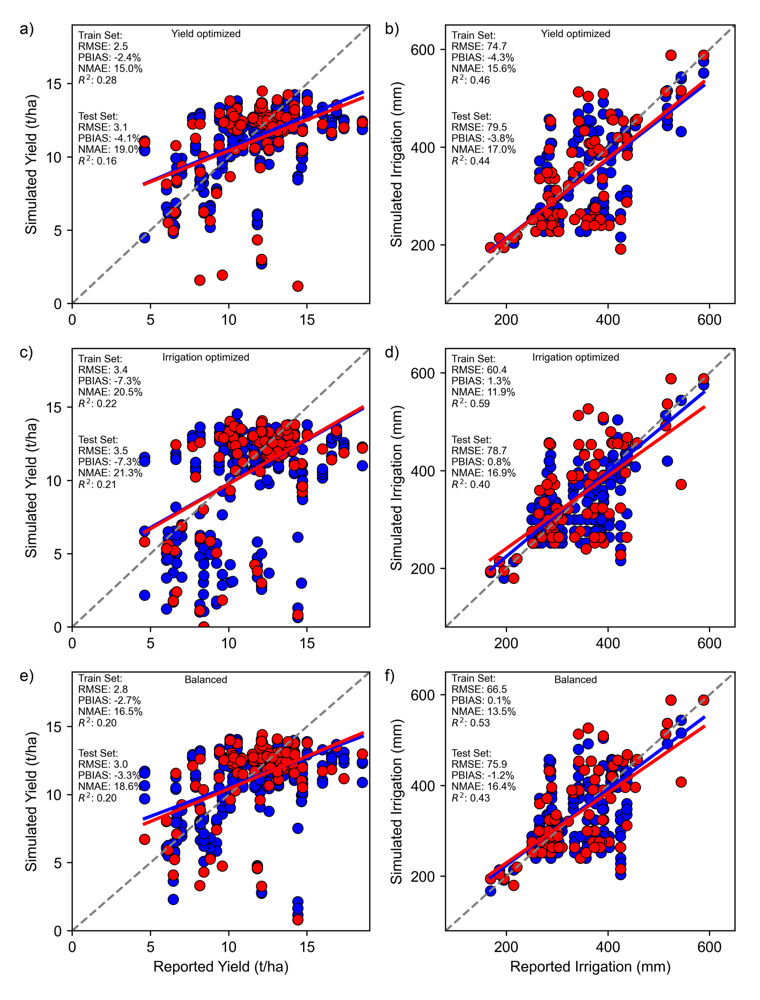

Saved: 6AQ.png


In [49]:
merge_images(
    image_paths="Aqua_6figs",
    output_name="6AQ.png",
     filenames=["yld_opt_yld.png", "yld_opt_irrig.png", "irrig_opt_yld.png", "irrig_opt_irrig.png",
                "bal_opt_yld.png", "bal_opt_irrig.png"],
    rows=3,
    cols=2,
    dpi =500,
    add_labels=True,
    

)



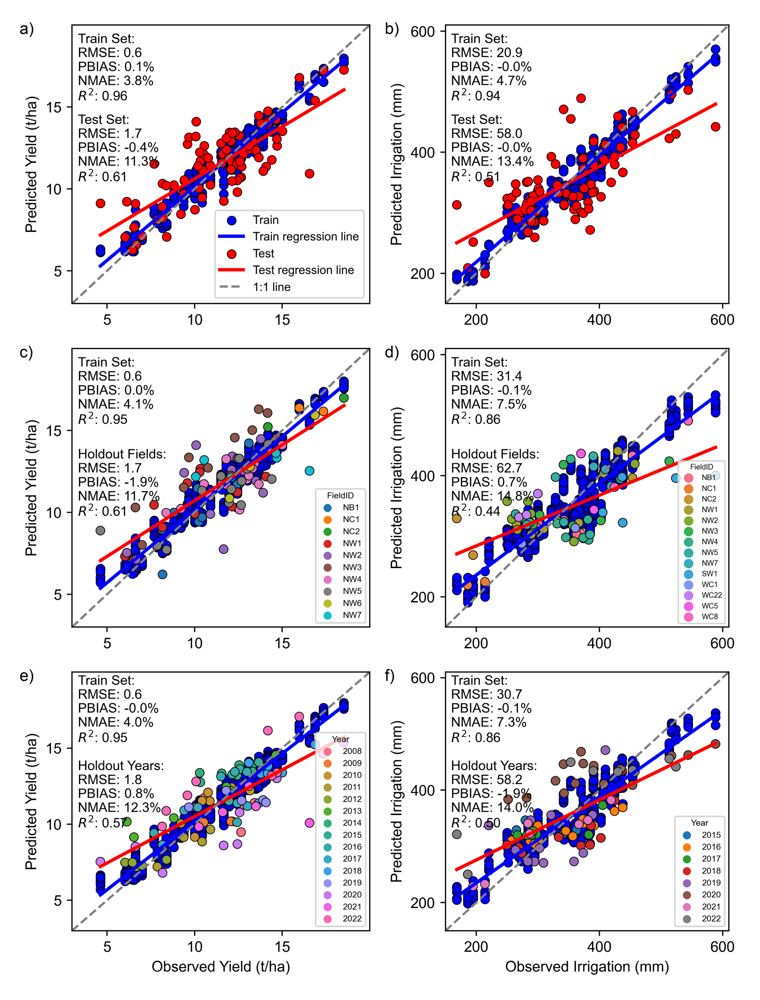

Saved: XGB6figspng.png


In [51]:
merge_images(
    image_paths="XGBoost_6figs",
    output_name="XGB6figspng.png",
     filenames=["cv_yld.png", "cv_irrig.png", "spa_yld.png", "spa_irrig.png",
                "temp_yld.png", "temp_irrig.png"],
    rows=3,
    cols=2,
    dpi =500
#     target_width_px=5000,
#     max_height_px=4000
)
